In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [3]:
pd.set_option('display.max_columns', None)

In [4]:
dataset = pd.read_csv('zomato.csv',  thousands=',')

In [5]:
dataset.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [6]:
len(dataset.url.unique())

51717

In [7]:
dataset.shape

(51717, 17)

In [8]:
dataset.dtypes

url                             object
address                         object
name                            object
online_order                    object
book_table                      object
rate                            object
votes                            int64
phone                           object
location                        object
rest_type                       object
dish_liked                      object
cuisines                        object
approx_cost(for two people)    float64
reviews_list                    object
menu_item                       object
listed_in(type)                 object
listed_in(city)                 object
dtype: object

In [9]:
dataset.isnull().sum()

url                                0
address                            0
name                               0
online_order                       0
book_table                         0
rate                            7775
votes                              0
phone                           1208
location                          21
rest_type                        227
dish_liked                     28078
cuisines                          45
approx_cost(for two people)      346
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

In [10]:
[ (feature, len(dataset[feature].unique())) for feature in dataset.columns ]

[('url', 51717),
 ('address', 11495),
 ('name', 8792),
 ('online_order', 2),
 ('book_table', 2),
 ('rate', 65),
 ('votes', 2328),
 ('phone', 14927),
 ('location', 94),
 ('rest_type', 94),
 ('dish_liked', 5272),
 ('cuisines', 2724),
 ('approx_cost(for two people)', 71),
 ('reviews_list', 22513),
 ('menu_item', 9098),
 ('listed_in(type)', 7),
 ('listed_in(city)', 30)]

In [11]:
dataset['listed_in(city)'].unique()

array(['Banashankari', 'Bannerghatta Road', 'Basavanagudi', 'Bellandur',
       'Brigade Road', 'Brookefield', 'BTM', 'Church Street',
       'Electronic City', 'Frazer Town', 'HSR', 'Indiranagar',
       'Jayanagar', 'JP Nagar', 'Kalyan Nagar', 'Kammanahalli',
       'Koramangala 4th Block', 'Koramangala 5th Block',
       'Koramangala 6th Block', 'Koramangala 7th Block', 'Lavelle Road',
       'Malleshwaram', 'Marathahalli', 'MG Road', 'New BEL Road',
       'Old Airport Road', 'Rajajinagar', 'Residency Road',
       'Sarjapur Road', 'Whitefield'], dtype=object)

<AxesSubplot:ylabel='Frequency'>

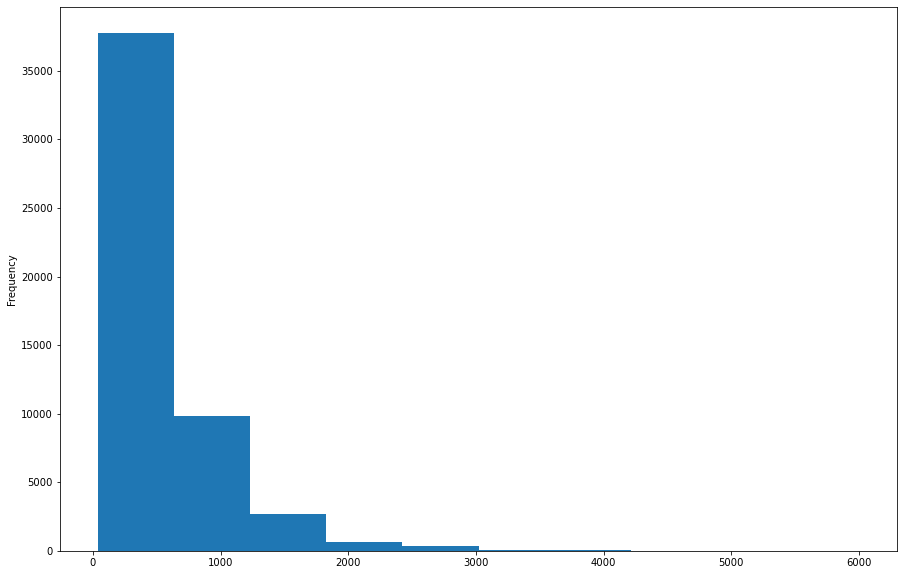

In [12]:
dataset['approx_cost(for two people)'].plot(kind = 'hist', figsize = (15,10))

In [13]:
dataset['approx_cost(for two people)'].unique()

array([ 800.,  300.,  600.,  700.,  550.,  500.,  450.,  650.,  400.,
        900.,  200.,  750.,  150.,  850.,  100., 1200.,  350.,  250.,
        950., 1000., 1500., 1300.,  199.,   80., 1100.,  160., 1600.,
        230.,  130.,   50.,  190., 1700.,   nan, 1400.,  180., 1350.,
       2200., 2000., 1800., 1900.,  330., 2500., 2100., 3000., 2800.,
       3400.,   40., 1250., 3500., 4000., 2400., 2600.,  120., 1450.,
        469.,   70., 3200.,   60.,  560.,  240.,  360., 6000., 1050.,
       2300., 4100., 5000., 3700., 1650., 2700., 4500.,  140.])

<AxesSubplot:ylabel='Frequency'>

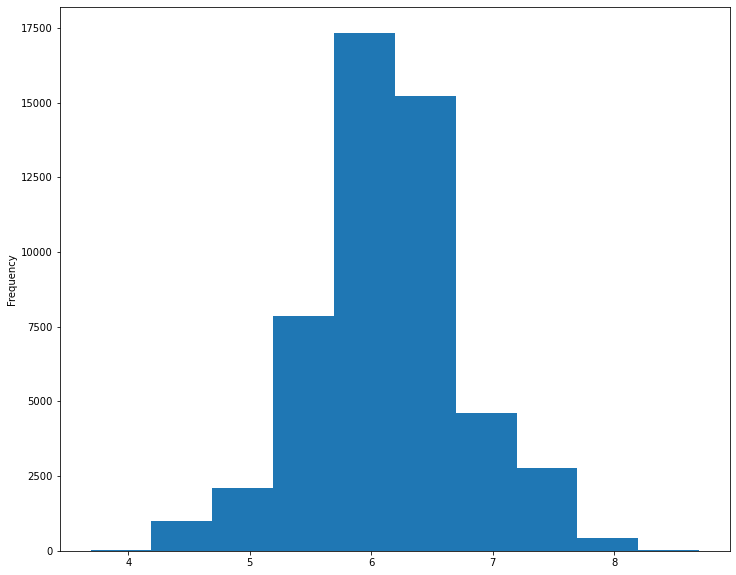

In [14]:
np.log(dataset['approx_cost(for two people)']).plot(kind = 'hist', figsize = (12,10))

In [15]:
dataset['approx_cost(for two people)'] = dataset['approx_cost(for two people)'].fillna(dataset['approx_cost(for two people)'].median())

In [16]:
dataset['approx_cost(for two people)']

0         800.0
1         800.0
2         800.0
3         300.0
4         600.0
          ...  
51712    1500.0
51713     600.0
51714    2000.0
51715    2500.0
51716    1500.0
Name: approx_cost(for two people), Length: 51717, dtype: float64

In [17]:
dataset['rate'].unique()

array(['4.1/5', '3.8/5', '3.7/5', '3.6/5', '4.6/5', '4.0/5', '4.2/5',
       '3.9/5', '3.1/5', '3.0/5', '3.2/5', '3.3/5', '2.8/5', '4.4/5',
       '4.3/5', 'NEW', '2.9/5', '3.5/5', nan, '2.6/5', '3.8 /5', '3.4/5',
       '4.5/5', '2.5/5', '2.7/5', '4.7/5', '2.4/5', '2.2/5', '2.3/5',
       '3.4 /5', '-', '3.6 /5', '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5',
       '4.1 /5', '3.7 /5', '3.1 /5', '2.9 /5', '3.3 /5', '2.8 /5',
       '3.5 /5', '2.7 /5', '2.5 /5', '3.2 /5', '2.6 /5', '4.5 /5',
       '4.3 /5', '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '4.6 /5',
       '4.9 /5', '3.0 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5',
       '2.1 /5', '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

In [18]:
dataset['rate'] = dataset['rate'].str.split('/').str[0].replace('.', ',')

In [19]:
data = dataset.copy()
dataset = data.loc[data['rate'] !='NEW'].reset_index(drop = True)

In [20]:
dataset = dataset[dataset['rate'] !='-'].reset_index(drop = True)

<AxesSubplot:ylabel='Frequency'>

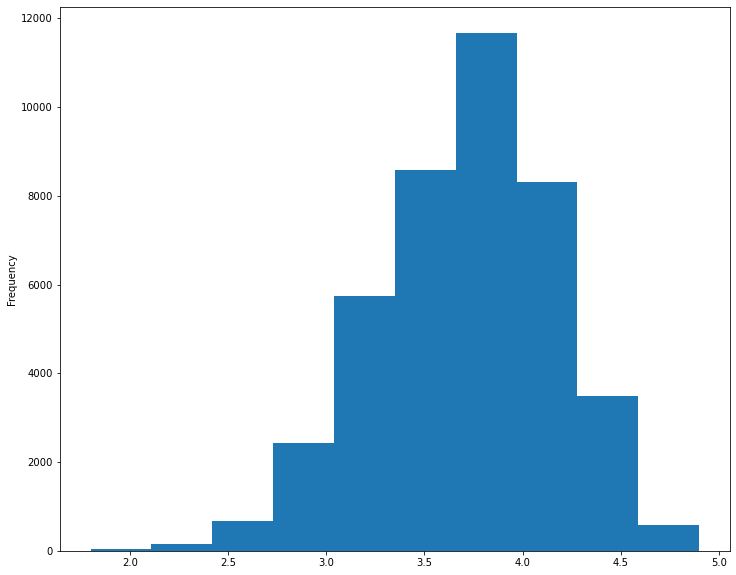

In [21]:
dataset['rate'].astype(float).plot(kind = 'hist',figsize = (12,10))

In [22]:
dataset['rate'] = dataset['rate'].fillna(dataset['rate'].astype(float).median())

In [23]:
dataset['rate'] = dataset['rate'].astype(float)

In [24]:
dataset['rate'].dtypes

dtype('float64')

In [25]:
dataset.isnull().sum()

url                                0
address                            0
name                               0
online_order                       0
book_table                         0
rate                               0
votes                              0
phone                           1190
location                          21
rest_type                        225
dish_liked                     25948
cuisines                          45
approx_cost(for two people)        0
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

In [26]:
dataset = dataset.rename(columns = {'approx_cost(for two people)': 'cost', 'listed_in(type)': 'type', 'listed_in(city)': 'city'})

In [28]:
dataset.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,cost,reviews_list,menu_item,type,city
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [29]:
dataset['online_order'] = dataset['online_order'].map(lambda x: True if x=='Yes' else False)

In [30]:
dataset['book_table'] = dataset['book_table'].replace(['Yes', 'No'], [True, False])

In [31]:
dataset.drop(['url', 'dish_liked'], axis = 1, inplace = True)

In [32]:
dataset.drop('phone', axis = 1, inplace = True)

In [33]:
dataset.duplicated().sum()

35

In [35]:
dataset.drop_duplicates(inplace = True)

In [37]:
def factorize_columns(dataset):
    fact_col = set(dataset.columns) - set(['rate', 'cost', 'votes'])
    for feature in fact_col:
        dataset[feature] = dataset[feature].factorize()[0]
    return dataset

In [38]:
data =dataset.copy()
data_factor = factorize_columns(data)
data_factor.head()

,address,name,online_order,book_table,rate,votes,location,rest_type,cuisines,cost,reviews_list,menu_item,type,city
0,0,0,0,0,4.1,775,0,0,0,800.0,0,0,0,0
1,1,1,0,1,4.1,787,0,0,1,800.0,1,0,0,0
2,2,2,0,1,3.8,918,0,1,2,800.0,2,0,0,0
3,3,3,1,1,3.7,88,0,2,3,300.0,3,0,0,0
4,4,4,1,1,3.8,166,1,0,4,600.0,4,0,0,0


In [39]:
data_factor.corr(method = 'kendall')

,address,name,online_order,book_table,rate,votes,location,rest_type,cuisines,cost,reviews_list,menu_item,type,city
address,1.000000,0.629754,0.151478,0.026857,-0.026625,-0.070746,0.359900,0.010997,0.088280,-0.030071,0.342196,-0.039630,0.074025,0.281443
name,0.629754,1.000000,0.212339,-0.020421,-0.038279,-0.115474,0.273717,-0.003100,0.146967,-0.012027,0.191662,-0.096438,0.092013,0.199139
online_order,0.151478,0.212339,1.000000,0.001488,-0.072780,-0.236581,0.053019,0.093129,-0.016601,-0.027669,-0.082087,-0.428480,0.224060,0.049054
book_table,0.026857,-0.020421,0.001488,1.000000,-0.368737,-0.379753,-0.049359,-0.047889,-0.195108,-0.435596,-0.151807,0.016318,-0.096090,-0.020420
rate,-0.026625,-0.038279,-0.072780,-0.368737,1.000000,0.406960,0.045505,0.079105,0.143541,0.259330,0.115696,0.057714,0.021137,0.016138
votes,-0.070746,-0.115474,-0.236581,-0.379753,0.406960,1.000000,0.033058,-0.045740,0.163987,0.397205,0.296621,0.122360,0.019686,0.003275
location,0.359900,0.273717,0.053019,-0.049359,0.045505,0.033058,1.000000,0.032342,0.083520,0.068844,0.243653,0.009772,0.041505,0.255805
rest_type,0.010997,-0.003100,0.093129,-0.047889,0.079105,-0.045740,0.032342,1.000000,0.019848,-0.064686,0.005358,-0.008961,0.000735,0.021196
cuisines,0.088280,0.146967,-0.016601,-0.195108,0.143541,0.163987,0.083520,0.019848,1.000000,0.198991,0.121363,0.019565,0.046193,0.050616
cost,-0.030071,-0.012027,-0.027669,-0.435596,0.259330,0.397205,0.068844,-0.064686,0.198991,1.000000,0.173118,0.008682,0.060672,0.022316


In [ ]:
sns.heatmap(data_factor, annot= True)
plt.figure(figsize = (12,10))


###  Regression Algorithms

In [40]:
from sklearn.model_selection import train_test_split

In [43]:
X = data_factor.drop('rate', axis = 1)
y = data_factor['rate']

In [44]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=10, shuffle=True)

#### Linear Regression

In [47]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
reg = LinearRegression()
reg.fit(X_train, y_train)
y_pred = reg.predict(X_test)
r2_score(y_test, y_pred)

0.26531463315179915

#### Decision Tree Regressor

In [57]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score
DecTree = DecisionTreeRegressor(min_samples_leaf=0.0001)
DecTree.fit(X_train, y_train)
y_pred = DecTree.predict(X_test)
r2_score(y_test, y_pred)


0.8123551051546505

#### Random Forest Regression

In [58]:
from sklearn.ensemble import RandomForestRegressor

RandForReg  =RandomForestRegressor(n_estimators=500, random_state= 35,  min_samples_leaf=0.0001)
RandForReg.fit(X_train, y_train)
y_pred = RandForReg.predict(X_test)
r2_score(y_test, y_pred)


0.8650524735346901

### Extra Tree Regressor

In [62]:
from sklearn.ensemble import ExtraTreesRegressor
ETree = ExtraTreesRegressor(n_estimators= 100)
ETree.fit(X_train, y_train)
y_pred = ETree.predict(X_test)
r2_score(y_test, y_pred)

0.9117033003693242

In [65]:
# To save your best performed model
import pickle
pickle.dump(ETree, open('ExtraTreeModel.pkl', 'wb'))

In [66]:
[(feature ,len(data_factor[feature].unique())) for feature in data_factor.columns ]

[('address', 11050),
 ('name', 8458),
 ('online_order', 2),
 ('book_table', 2),
 ('rate', 31),
 ('votes', 2328),
 ('location', 94),
 ('rest_type', 94),
 ('cuisines', 2633),
 ('cost', 68),
 ('reviews_list', 22070),
 ('menu_item', 8784),
 ('type', 7),
 ('city', 30)]

### Data Visualization

In [101]:
import cufflinks as cf

In [102]:
cf.go_offline()

In [72]:
categorical_feature =[feature for feature in dataset.columns if len(dataset[feature].unique())<95 ]

In [112]:
for feature in categorical_feature:
    dataset[feature].iplot(kind= 'histogram', title = feature)
    
    
   

In [79]:
dataset[data_factor.type==2].type

31       Delivery
32       Delivery
33       Delivery
34       Delivery
35       Delivery
           ...   
48659    Delivery
48660    Delivery
48661    Delivery
48662    Delivery
48663    Delivery
Name: type, Length: 24699, dtype: object

In [99]:
for myvalue in data_factor.location.unique():
    print(myvalue, dataset[data_factor.location==myvalue].location.unique())

0 ['Banashankari']
1 ['Basavanagudi']
2 ['Mysore Road']
3 ['Jayanagar']
4 ['Kumaraswamy Layout']
5 ['Rajarajeshwari Nagar']
6 ['Vijay Nagar']
7 ['Uttarahalli']
8 ['JP Nagar']
9 ['South Bangalore']
10 ['City Market']
11 ['Nagarbhavi']
12 ['Bannerghatta Road']
13 ['BTM']
14 ['Kanakapura Road']
15 ['Bommanahalli']
-1 [nan]
16 ['Electronic City']
17 ['HSR']
18 ['Marathahalli']
19 ['Sarjapur Road']
20 ['Wilson Garden']
21 ['Shanti Nagar']
22 ['Koramangala 5th Block']
23 ['Koramangala 8th Block']
24 ['Richmond Road']
25 ['Koramangala 7th Block']
26 ['Jalahalli']
27 ['Koramangala 4th Block']
28 ['Bellandur']
29 ['Whitefield']
30 ['East Bangalore']
31 ['Old Airport Road']
32 ['Indiranagar']
33 ['Koramangala 1st Block']
34 ['Frazer Town']
35 ['RT Nagar']
36 ['MG Road']
37 ['Brigade Road']
38 ['Lavelle Road']
39 ['Church Street']
40 ['Ulsoor']
41 ['Residency Road']
42 ['Shivajinagar']
43 ['Infantry Road']
44 ['St. Marks Road']
45 ['Cunningham Road']
46 ['Race Course Road']
47 ['Commercial Street

In [104]:
dataset['location'].iplot(kind = 'histogram')

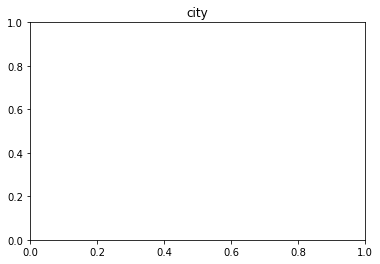

In [109]:
for feature in categorical_feature:
    dataset.groupby(feature)['rate'].median().iplot(kind= 'bar', title=featureureure)
    plt.title(feature)


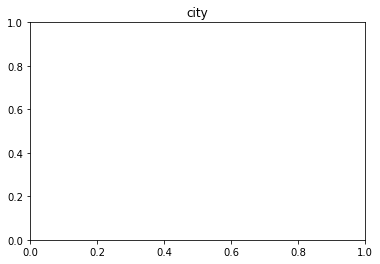

In [117]:
for feature in categorical_feature:
    dataset.groupby(feature)['rate'].median().iplot(kind= 'scatter', title=feature)
    plt.title(feature)

In [ ]:
dataset.iplot()